In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
from white_demura import mean_pooling, run_dfs, run_dfs_green, reconstruct_mask, RGB_mask_no_roi, RGB_mask, sum_contour, read_and_extract_roi, apply_mask, get_signal_mapping, generate_mapping, extract_middle_roi
from read_images import generate_RGB_dataframes, get_signal_mapping_overlap

In [2]:
edge_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/mask_edges.png'
edge_image = cv2.imread(edge_path, cv2.IMREAD_GRAYSCALE)
edge_mask = np.where(edge_image == 255, 1, 0)

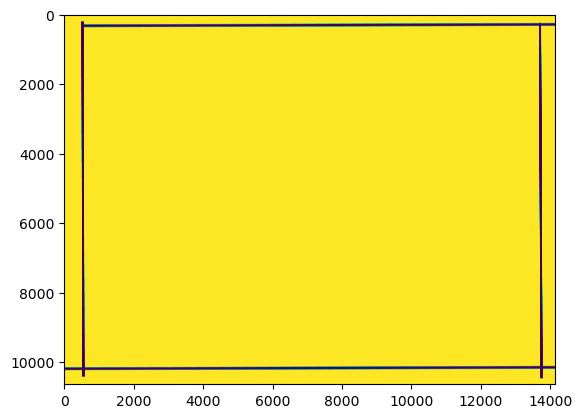

In [3]:
plt.imshow(edge_mask)
plt.show()

In [4]:
red_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_X_21000.bmp'
green_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Y_17500.bmp'
blue_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Z_28000.bmp'

clear_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_clear_21000.bmp'


red_image_255 = cv2.imread(red_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
green_image_255 = cv2.imread(green_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
blue_image_255 = cv2.imread(blue_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
clear_image_255 = cv2.imread(blue_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask

red_image_255 = mean_pooling(red_image_255, 6).astype(np.int16)
green_image_255 = mean_pooling(green_image_255, 6).astype(np.int16)
blue_image_255 = mean_pooling(blue_image_255, 6).astype(np.int16)
clear_image_255 = mean_pooling(clear_image_255, 6).astype(np.int16)

red_binary = np.where(red_image_255 > 8, 255, 0)
green_binary = np.where(green_image_255 > 8, 255, 0)
blue_binary = np.where(blue_image_255 > 8, 255, 0)


In [5]:
blue_binary.shape

(1774, 2358)

In [6]:
red_covered_pixels_mapping = run_dfs(red_binary,3)


copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [7]:
green_covered_pixels_mapping = run_dfs(green_binary,5)


copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [8]:
blue_covered_pixels_mapping = run_dfs(blue_binary,4)

copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [9]:
red_new_df, green_new_df, blue_new_df, a = generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, True, 6, mask=edge_mask)

<Axes: xlabel='index'>

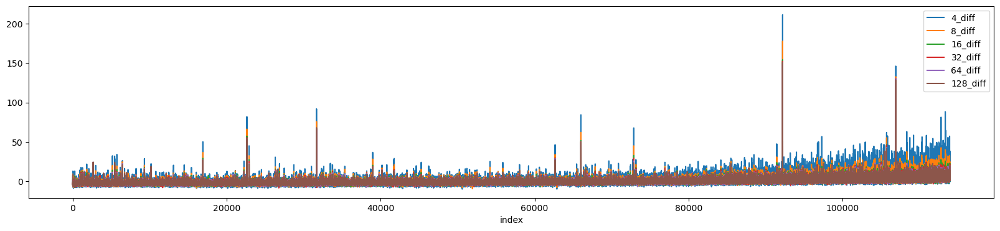

In [10]:
red_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff'])

<Axes: xlabel='index'>

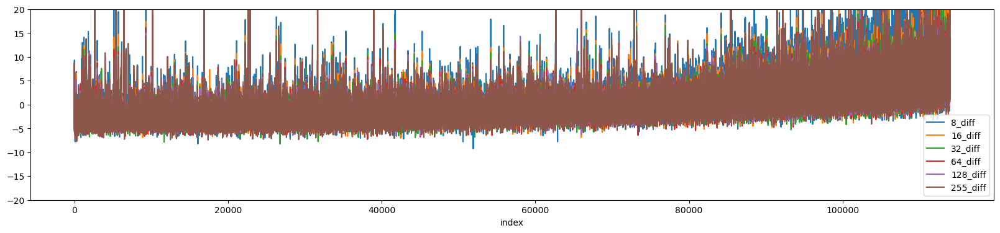

In [11]:
red_new_df.reset_index().plot(figsize=[20, 4], ylim = [-20, 20],x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

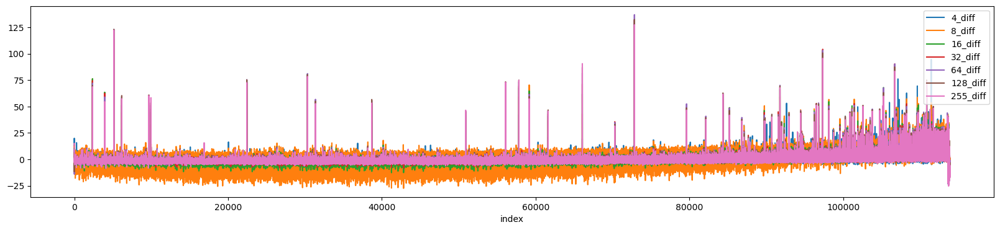

In [12]:
green_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

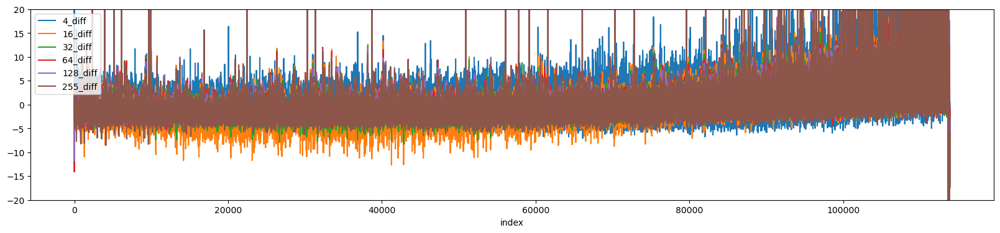

In [13]:
green_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

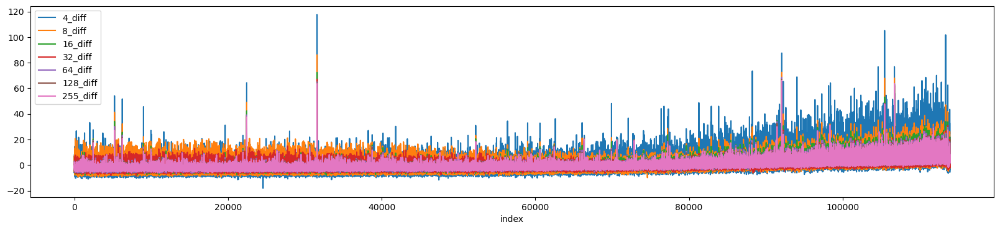

In [14]:
blue_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

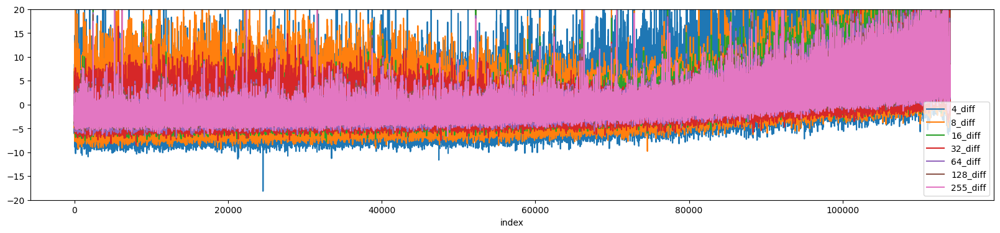

In [15]:
blue_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [16]:

red_binary = reconstruct_mask(red_binary, red_covered_pixels_mapping)

green_binary = reconstruct_mask(green_binary, green_covered_pixels_mapping)

blue_binary = reconstruct_mask(blue_binary, blue_covered_pixels_mapping)

In [17]:
red_binary.shape

(1774, 2358)

In [18]:
cv2.imwrite('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/red_image_255.png', red_image_255)

True

In [19]:
rgb_binary = np.array([red_binary, green_binary, blue_binary])
rgb_percentage = np.zeros(rgb_binary.shape)

In [20]:
def normalize(image_255, thres, max):
    norm = np.where(image_255 > thres, image_255, 0)
    norm = max * (norm / norm[norm > 0].mean())
    return norm


In [21]:
red_image_255_norm = normalize(red_image_255, 8, 200)
green_image_255_norm = normalize(green_image_255, 8, 200)
blue_image_255_norm = normalize(blue_image_255, 8, 200)

In [22]:

for row in range(0,len(rgb_binary[0])):
    for col in range(0, len(rgb_binary[0][0])):
        if (rgb_binary[0][row][col] != 0 and rgb_binary[1][row][col] != 0) or (rgb_binary[0][row][col] != 0 and rgb_binary[2][row][col] != 0) or (rgb_binary[1][row][col] != 0 and rgb_binary[2][row][col] != 0):
            sum = red_image_255_norm[row][col] + green_image_255_norm[row][col] + blue_image_255_norm[row][col]
            rgb_percentage[0][row][col] = red_image_255_norm[row][col] / sum
            rgb_percentage[1][row][col] = green_image_255_norm[row][col] / sum
            rgb_percentage[2][row][col] = blue_image_255_norm[row][col] / sum


In [23]:
rgb_percentage

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]])

In [24]:

def generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, is_down_sample=False, kernal=5, overlap_percentage=None, mask=None):
    clear_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_clear_140000000.bmp', cv2.IMREAD_GRAYSCALE)

    if type(mask) == type(None):
        mask = np.ones_like(clear_image_4)

    clear_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_clear_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_clear_49000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_clear_11200000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_clear_2800000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_clear_489999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_clear_125999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_clear_21000.bmp', cv2.IMREAD_GRAYSCALE) * mask

    red_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_X_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_X_49000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_X_11200000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_X_3500000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_X_595000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_X_125999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_X_21000.bmp', cv2.IMREAD_GRAYSCALE) * mask


    green_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_Y_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_Y_28000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_Y_8750000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_Y_2100000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_Y_455000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_Y_91000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Y_17500.bmp', cv2.IMREAD_GRAYSCALE) * mask


    blue_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_Z_210000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_Z_77000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_Z_14699999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_Z_4550000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_Z_770000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_Z_140000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Z_28000.bmp', cv2.IMREAD_GRAYSCALE) * mask

    overlap_set = []
    if is_down_sample:
        clear_image_4 = mean_pooling(clear_image_4, kernal).astype(np.int16)
        clear_image_8 = mean_pooling(clear_image_8, kernal).astype(np.int16)
        clear_image_16 = mean_pooling(clear_image_16, kernal).astype(np.int16)
        clear_image_32 = mean_pooling(clear_image_32, kernal).astype(np.int16)
        clear_image_64 = mean_pooling(clear_image_64, kernal).astype(np.int16)
        clear_image_128 = mean_pooling(clear_image_128, kernal).astype(np.int16)
        clear_image_255 = mean_pooling(clear_image_255, kernal).astype(np.int16)

        red_image_4 = mean_pooling(red_image_4, kernal).astype(np.int16)
        red_image_8 = mean_pooling(red_image_8, kernal).astype(np.int16)
        red_image_16 = mean_pooling(red_image_16, kernal).astype(np.int16)
        red_image_32 = mean_pooling(red_image_32, kernal).astype(np.int16)
        red_image_64 = mean_pooling(red_image_64, kernal).astype(np.int16)
        red_image_128 = mean_pooling(red_image_128, kernal).astype(np.int16)
        red_image_255 = mean_pooling(red_image_255, kernal).astype(np.int16)


        green_image_4 = mean_pooling(green_image_4, kernal).astype(np.int16)
        green_image_8 = mean_pooling(green_image_8, kernal).astype(np.int16)
        green_image_16 = mean_pooling(green_image_16, kernal).astype(np.int16)
        green_image_32 = mean_pooling(green_image_32, kernal).astype(np.int16)
        green_image_64 = mean_pooling(green_image_64, kernal).astype(np.int16)
        green_image_128 = mean_pooling(green_image_128, kernal).astype(np.int16)
        green_image_255 = mean_pooling(green_image_255, kernal).astype(np.int16)


        blue_image_4 = mean_pooling(blue_image_4, kernal).astype(np.int16)
        blue_image_8 = mean_pooling(blue_image_8, kernal).astype(np.int16)
        blue_image_16 = mean_pooling(blue_image_16, kernal).astype(np.int16)
        blue_image_32 = mean_pooling(blue_image_32, kernal).astype(np.int16)
        blue_image_64 = mean_pooling(blue_image_64, kernal).astype(np.int16)
        blue_image_128 = mean_pooling(blue_image_128, kernal).astype(np.int16)
        blue_image_255 = mean_pooling(blue_image_255, kernal).astype(np.int16)
    
    if overlap_percentage is not None:
        print('overlap_percentage loading....')
        red_signal_map_4, a = get_signal_mapping_overlap(clear_image_4, red_covered_pixels_mapping, overlap_percentage[0])
        overlap_set = overlap_set + (a)
        red_signal_map_8 = get_signal_mapping_overlap(clear_image_8, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_16 = get_signal_mapping_overlap(clear_image_16, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_32 = get_signal_mapping_overlap(clear_image_32, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_64 = get_signal_mapping_overlap(clear_image_64, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_128 = get_signal_mapping_overlap(clear_image_128, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_255 = get_signal_mapping_overlap(clear_image_255, red_covered_pixels_mapping, overlap_percentage[0])[0]

        green_signal_map_4,a = get_signal_mapping_overlap(clear_image_4, green_covered_pixels_mapping, overlap_percentage[1])
        overlap_set = overlap_set + (a)
        green_signal_map_8 = get_signal_mapping_overlap(clear_image_8, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_16 = get_signal_mapping_overlap(clear_image_16, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_32 = get_signal_mapping_overlap(clear_image_32, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_64 = get_signal_mapping_overlap(clear_image_64, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_128 = get_signal_mapping_overlap(clear_image_128, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_255 = get_signal_mapping_overlap(clear_image_255, green_covered_pixels_mapping, overlap_percentage[1])[0]

        blue_signal_map_4,a = get_signal_mapping_overlap(clear_image_4, blue_covered_pixels_mapping, overlap_percentage[2])
        overlap_set = overlap_set + (a)
        blue_signal_map_8 = get_signal_mapping_overlap(clear_image_8, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_16 = get_signal_mapping_overlap(clear_image_16, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_32 = get_signal_mapping_overlap(clear_image_32, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_64 = get_signal_mapping_overlap(clear_image_64, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_128 = get_signal_mapping_overlap(clear_image_128, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_255 = get_signal_mapping_overlap(clear_image_255, blue_covered_pixels_mapping, overlap_percentage[2])[0]

    else:
        red_signal_map_4 = get_signal_mapping(clear_image_4, red_covered_pixels_mapping)
        red_signal_map_8 = get_signal_mapping(clear_image_8, red_covered_pixels_mapping)
        red_signal_map_16 = get_signal_mapping(clear_image_16, red_covered_pixels_mapping)
        red_signal_map_32 = get_signal_mapping(clear_image_32, red_covered_pixels_mapping)
        red_signal_map_64 = get_signal_mapping(clear_image_64, red_covered_pixels_mapping)
        red_signal_map_128 = get_signal_mapping(clear_image_128, red_covered_pixels_mapping)
        red_signal_map_255 = get_signal_mapping(clear_image_255, red_covered_pixels_mapping)

        green_signal_map_4 = get_signal_mapping(clear_image_4, green_covered_pixels_mapping)
        green_signal_map_8 = get_signal_mapping(clear_image_8, green_covered_pixels_mapping)
        green_signal_map_16 = get_signal_mapping(clear_image_16, green_covered_pixels_mapping)
        green_signal_map_32 = get_signal_mapping(clear_image_32, green_covered_pixels_mapping)
        green_signal_map_64 = get_signal_mapping(clear_image_64, green_covered_pixels_mapping)
        green_signal_map_128 = get_signal_mapping(clear_image_128, green_covered_pixels_mapping)
        green_signal_map_255 = get_signal_mapping(clear_image_255, green_covered_pixels_mapping)

        blue_signal_map_4 = get_signal_mapping(clear_image_4, blue_covered_pixels_mapping)
        blue_signal_map_8 = get_signal_mapping(clear_image_8, blue_covered_pixels_mapping)
        blue_signal_map_16 = get_signal_mapping(clear_image_16, blue_covered_pixels_mapping)
        blue_signal_map_32 = get_signal_mapping(clear_image_32, blue_covered_pixels_mapping)
        blue_signal_map_64 = get_signal_mapping(clear_image_64, blue_covered_pixels_mapping)
        blue_signal_map_128 = get_signal_mapping(clear_image_128, blue_covered_pixels_mapping)
        blue_signal_map_255 = get_signal_mapping(clear_image_255, blue_covered_pixels_mapping)

    red_signal_map_ground_truth_4 = get_signal_mapping(red_image_4, red_covered_pixels_mapping)
    red_signal_map_ground_truth_8 = get_signal_mapping(red_image_8, red_covered_pixels_mapping)
    red_signal_map_ground_truth_16 = get_signal_mapping(red_image_16, red_covered_pixels_mapping)
    red_signal_map_ground_truth_32 = get_signal_mapping(red_image_32, red_covered_pixels_mapping)
    red_signal_map_ground_truth_64 = get_signal_mapping(red_image_64, red_covered_pixels_mapping)
    red_signal_map_ground_truth_128 = get_signal_mapping(red_image_128, red_covered_pixels_mapping)
    red_signal_map_ground_truth_255 = get_signal_mapping(red_image_255, red_covered_pixels_mapping)

    green_signal_map_ground_truth_4 = get_signal_mapping(green_image_4, green_covered_pixels_mapping)
    green_signal_map_ground_truth_8 = get_signal_mapping(green_image_8, green_covered_pixels_mapping)
    green_signal_map_ground_truth_16 = get_signal_mapping(green_image_16, green_covered_pixels_mapping)
    green_signal_map_ground_truth_32 = get_signal_mapping(green_image_32, green_covered_pixels_mapping)
    green_signal_map_ground_truth_64 = get_signal_mapping(green_image_64, green_covered_pixels_mapping)
    green_signal_map_ground_truth_128 = get_signal_mapping(green_image_128, green_covered_pixels_mapping)
    green_signal_map_ground_truth_255 = get_signal_mapping(green_image_255, green_covered_pixels_mapping)

    blue_signal_map_ground_truth_4 = get_signal_mapping(blue_image_4, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_8 = get_signal_mapping(blue_image_8, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_16 = get_signal_mapping(blue_image_16, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_32 = get_signal_mapping(blue_image_32, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_64 = get_signal_mapping(blue_image_64, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_128 = get_signal_mapping(blue_image_128, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_255 = get_signal_mapping(blue_image_255, blue_covered_pixels_mapping)


    red_df = pd.DataFrame()
    green_df = pd.DataFrame()
    blue_df = pd.DataFrame()

    red_df["4_ground_truth_mapping"] = red_signal_map_ground_truth_4.values()
    red_df["8_ground_truth_mapping"] = red_signal_map_ground_truth_8.values()
    red_df["16_ground_truth_mapping"] = red_signal_map_ground_truth_16.values()
    red_df["32_ground_truth_mapping"] = red_signal_map_ground_truth_32.values()
    red_df["64_ground_truth_mapping"] = red_signal_map_ground_truth_64.values()
    red_df["128_ground_truth_mapping"] = red_signal_map_ground_truth_128.values()
    red_df["255_ground_truth_mapping"] = red_signal_map_ground_truth_255.values()

    red_df["4_mapping"] = red_signal_map_4.values()
    red_df["8_mapping"] = red_signal_map_8.values()
    red_df["16_mapping"] = red_signal_map_16.values()
    red_df["32_mapping"] = red_signal_map_32.values()
    red_df["64_mapping"] = red_signal_map_64.values()
    red_df["128_mapping"] = red_signal_map_128.values()
    red_df["255_mapping"] = red_signal_map_255.values()

    red_df["4_diff"] = red_df["4_ground_truth_mapping"] - red_df["4_mapping"]
    red_df["8_diff"] = red_df["8_ground_truth_mapping"] - red_df["8_mapping"]
    red_df["16_diff"] = red_df["16_ground_truth_mapping"] - red_df["16_mapping"]
    red_df["32_diff"] = red_df["32_ground_truth_mapping"] - red_df["32_mapping"]
    red_df["64_diff"] = red_df["64_ground_truth_mapping"] - red_df["64_mapping"]
    red_df["128_diff"] = red_df["128_ground_truth_mapping"] - red_df["128_mapping"]
    red_df["255_diff"] = red_df["255_ground_truth_mapping"] - red_df["255_mapping"]

    red_df["4_to_gt_ratio"] = red_df["4_mapping"] / red_df["4_ground_truth_mapping"]
    red_df["8_to_gt_ratio"] = red_df["8_mapping"] / red_df["8_ground_truth_mapping"] 
    red_df["16_to_gt_ratio"] = red_df["16_mapping"] / red_df["16_ground_truth_mapping"]
    red_df["32_to_gt_ratio"] = red_df["32_mapping"] / red_df["32_ground_truth_mapping"]
    red_df["64_to_gt_ratio"] = red_df["64_mapping"] / red_df["64_ground_truth_mapping"]
    red_df["128_to_gt_ratio"] = red_df["128_mapping"] / red_df["128_ground_truth_mapping"]
    red_df["255_to_gt_ratio"] = red_df["255_mapping"] / red_df["255_ground_truth_mapping"]

    red_df["4_diff_percentage"] = ((red_df['4_to_gt_ratio'].mean() - 1) * 100)
    red_df["8_diff_percentage"] = ((red_df['8_to_gt_ratio'].mean() - 1) * 100)
    red_df["16_diff_percentage"] = ((red_df['16_to_gt_ratio'].mean() - 1) * 100)
    red_df["32_diff_percentage"] = ((red_df['32_to_gt_ratio'].mean() - 1) * 100)
    red_df["64_diff_percentage"] = ((red_df['64_to_gt_ratio'].mean() - 1) * 100)
    red_df["128_diff_percentage"] = ((red_df['128_to_gt_ratio'].mean() - 1) * 100)
    red_df["255_diff_percentage"] = ((red_df['255_to_gt_ratio'].mean() - 1) * 100)

    red_df['4_normalized'] = red_df['4_to_gt_ratio'].mean() * red_df["4_ground_truth_mapping"]
    red_df['8_normalized'] = red_df['8_to_gt_ratio'].mean() * red_df["8_ground_truth_mapping"]
    red_df['16_normalized'] = red_df['16_to_gt_ratio'].mean() * red_df["16_ground_truth_mapping"]
    red_df['32_normalized'] = red_df['32_to_gt_ratio'].mean() * red_df["32_ground_truth_mapping"]
    red_df['64_normalized'] = red_df['64_to_gt_ratio'].mean() * red_df["64_ground_truth_mapping"]
    red_df['128_normalized'] = red_df['128_to_gt_ratio'].mean() * red_df["128_ground_truth_mapping"]
    red_df['255_normalized'] = red_df['255_to_gt_ratio'].mean() * red_df["255_ground_truth_mapping"]




    green_df["4_ground_truth_mapping"] = green_signal_map_ground_truth_4.values()
    green_df["8_ground_truth_mapping"] = green_signal_map_ground_truth_8.values()
    green_df["16_ground_truth_mapping"] = green_signal_map_ground_truth_16.values()
    green_df["32_ground_truth_mapping"] = green_signal_map_ground_truth_32.values()
    green_df["64_ground_truth_mapping"] = green_signal_map_ground_truth_64.values()
    green_df["128_ground_truth_mapping"] = green_signal_map_ground_truth_128.values()
    green_df["255_ground_truth_mapping"] = green_signal_map_ground_truth_255.values()

    green_df["4_mapping"] = green_signal_map_4.values()
    green_df["8_mapping"] = green_signal_map_8.values()
    green_df["16_mapping"] = green_signal_map_16.values()
    green_df["32_mapping"] = green_signal_map_32.values()
    green_df["64_mapping"] = green_signal_map_64.values()
    green_df["128_mapping"] = green_signal_map_128.values()
    green_df["255_mapping"] = green_signal_map_255.values()

    green_df["4_diff"] = green_df["4_ground_truth_mapping"] - green_df["4_mapping"]
    green_df["8_diff"] = green_df["8_ground_truth_mapping"] - green_df["8_mapping"]
    green_df["16_diff"] = green_df["16_ground_truth_mapping"] - green_df["16_mapping"]
    green_df["32_diff"] = green_df["32_ground_truth_mapping"] - green_df["32_mapping"]
    green_df["64_diff"] = green_df["64_ground_truth_mapping"] - green_df["64_mapping"]
    green_df["128_diff"] = green_df["128_ground_truth_mapping"] - green_df["128_mapping"]
    green_df["255_diff"] = green_df["255_ground_truth_mapping"] - green_df["255_mapping"]

    green_df["4_to_gt_ratio"] = green_df["4_mapping"] / green_df["4_ground_truth_mapping"]
    green_df["8_to_gt_ratio"] = green_df["8_mapping"] / green_df["8_ground_truth_mapping"] 
    green_df["16_to_gt_ratio"] = green_df["16_mapping"] / green_df["16_ground_truth_mapping"]
    green_df["32_to_gt_ratio"] = green_df["32_mapping"] / green_df["32_ground_truth_mapping"]
    green_df["64_to_gt_ratio"] = green_df["64_mapping"] / green_df["64_ground_truth_mapping"]
    green_df["128_to_gt_ratio"] = green_df["128_mapping"] / green_df["128_ground_truth_mapping"]
    green_df["255_to_gt_ratio"] = green_df["255_mapping"] / green_df["255_ground_truth_mapping"]

    green_df["4_diff_percentage"] = ((green_df['4_to_gt_ratio'].mean() - 1) * 100)
    green_df["8_diff_percentage"] = ((green_df['8_to_gt_ratio'].mean() - 1) * 100)
    green_df["16_diff_percentage"] = ((green_df['16_to_gt_ratio'].mean() - 1) * 100)
    green_df["32_diff_percentage"] = ((green_df['32_to_gt_ratio'].mean() - 1) * 100)
    green_df["64_diff_percentage"] = ((green_df['64_to_gt_ratio'].mean() - 1) * 100)
    green_df["128_diff_percentage"] = ((green_df['128_to_gt_ratio'].mean() - 1) * 100)
    green_df["255_diff_percentage"] = ((green_df['255_to_gt_ratio'].mean() - 1) * 100)

    green_df['4_normalized'] = green_df['4_to_gt_ratio'].mean() * green_df["4_ground_truth_mapping"]
    green_df['8_normalized'] = green_df['8_to_gt_ratio'].mean() * green_df["8_ground_truth_mapping"]
    green_df['16_normalized'] = green_df['16_to_gt_ratio'].mean() * green_df["16_ground_truth_mapping"]
    green_df['32_normalized'] = green_df['32_to_gt_ratio'].mean() * green_df["32_ground_truth_mapping"]
    green_df['64_normalized'] = green_df['64_to_gt_ratio'].mean() * green_df["64_ground_truth_mapping"]
    green_df['128_normalized'] = green_df['128_to_gt_ratio'].mean() * green_df["128_ground_truth_mapping"]
    green_df['255_normalized'] = green_df['255_to_gt_ratio'].mean() * green_df["255_ground_truth_mapping"]



    blue_df["4_ground_truth_mapping"] = blue_signal_map_ground_truth_4.values()
    blue_df["8_ground_truth_mapping"] = blue_signal_map_ground_truth_8.values()
    blue_df["16_ground_truth_mapping"] = blue_signal_map_ground_truth_16.values()
    blue_df["32_ground_truth_mapping"] = blue_signal_map_ground_truth_32.values()
    blue_df["64_ground_truth_mapping"] = blue_signal_map_ground_truth_64.values()
    blue_df["128_ground_truth_mapping"] = blue_signal_map_ground_truth_128.values()
    blue_df["255_ground_truth_mapping"] = blue_signal_map_ground_truth_255.values()

    blue_df["4_mapping"] = blue_signal_map_4.values()
    blue_df["8_mapping"] = blue_signal_map_8.values()
    blue_df["16_mapping"] = blue_signal_map_16.values()
    blue_df["32_mapping"] = blue_signal_map_32.values()
    blue_df["64_mapping"] = blue_signal_map_64.values()
    blue_df["128_mapping"] = blue_signal_map_128.values()
    blue_df["255_mapping"] = blue_signal_map_255.values()

    blue_df["4_diff"] = blue_df["4_ground_truth_mapping"] - blue_df["4_mapping"]
    blue_df["8_diff"] = blue_df["8_ground_truth_mapping"] - blue_df["8_mapping"]
    blue_df["16_diff"] = blue_df["16_ground_truth_mapping"] - blue_df["16_mapping"]
    blue_df["32_diff"] = blue_df["32_ground_truth_mapping"] - blue_df["32_mapping"]
    blue_df["64_diff"] = blue_df["64_ground_truth_mapping"] - blue_df["64_mapping"]
    blue_df["128_diff"] = blue_df["128_ground_truth_mapping"] - blue_df["128_mapping"]
    blue_df["255_diff"] = blue_df["255_ground_truth_mapping"] - blue_df["255_mapping"]

    blue_df["4_to_gt_ratio"] = blue_df["4_mapping"] / blue_df["4_ground_truth_mapping"]
    blue_df["8_to_gt_ratio"] = blue_df["8_mapping"] / blue_df["8_ground_truth_mapping"] 
    blue_df["16_to_gt_ratio"] = blue_df["16_mapping"] / blue_df["16_ground_truth_mapping"]
    blue_df["32_to_gt_ratio"] = blue_df["32_mapping"] / blue_df["32_ground_truth_mapping"]
    blue_df["64_to_gt_ratio"] = blue_df["64_mapping"] / blue_df["64_ground_truth_mapping"]
    blue_df["128_to_gt_ratio"] = blue_df["128_mapping"] / blue_df["128_ground_truth_mapping"]
    blue_df["255_to_gt_ratio"] = blue_df["255_mapping"] / blue_df["255_ground_truth_mapping"]

    blue_df["4_diff_percentage"] = ((blue_df['4_to_gt_ratio'].mean() - 1) * 100)
    blue_df["8_diff_percentage"] = ((blue_df['8_to_gt_ratio'].mean() - 1) * 100)
    blue_df["16_diff_percentage"] = ((blue_df['16_to_gt_ratio'].mean() - 1) * 100)
    blue_df["32_diff_percentage"] = ((blue_df['32_to_gt_ratio'].mean() - 1) * 100)
    blue_df["64_diff_percentage"] = ((blue_df['64_to_gt_ratio'].mean() - 1) * 100)
    blue_df["128_diff_percentage"] = ((blue_df['128_to_gt_ratio'].mean() - 1) * 100)
    blue_df["255_diff_percentage"] = ((blue_df['255_to_gt_ratio'].mean() - 1) * 100)

    blue_df['4_normalized'] = blue_df['4_to_gt_ratio'].mean() * blue_df["4_ground_truth_mapping"]
    blue_df['8_normalized'] = blue_df['8_to_gt_ratio'].mean() * blue_df["8_ground_truth_mapping"]
    blue_df['16_normalized'] = blue_df['16_to_gt_ratio'].mean() * blue_df["16_ground_truth_mapping"]
    blue_df['32_normalized'] = blue_df['32_to_gt_ratio'].mean() * blue_df["32_ground_truth_mapping"]
    blue_df['64_normalized'] = blue_df['64_to_gt_ratio'].mean() * blue_df["64_ground_truth_mapping"]
    blue_df['128_normalized'] = blue_df['128_to_gt_ratio'].mean() * blue_df["128_ground_truth_mapping"]
    blue_df['255_normalized'] = blue_df['255_to_gt_ratio'].mean() * blue_df["255_ground_truth_mapping"]


    red_new_df = pd.DataFrame()

    red_new_df['4_diff'] = 100 * ((red_df['4_mapping'] / red_df['4_mapping'].mean()) - (red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()))/((red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()))
    red_new_df['8_diff'] = 100 * ((red_df['8_mapping'] / red_df['8_mapping'].mean()) - (red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()))/((red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()))
    red_new_df['16_diff'] = 100 * ((red_df['16_mapping'] / red_df['16_mapping'].mean()) - (red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()))/((red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()))
    red_new_df['32_diff'] = 100 * ((red_df['32_mapping'] / red_df['32_mapping'].mean()) - (red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()))/((red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()))
    red_new_df['64_diff'] = 100 * ((red_df['64_mapping'] / red_df['64_mapping'].mean()) - (red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()))/((red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()))
    red_new_df['128_diff'] = 100 * ((red_df['128_mapping'] / red_df['128_mapping'].mean()) - (red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()))/((red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()))
    red_new_df['255_diff'] = 100 * ((red_df['255_mapping'] / red_df['255_mapping'].mean()) - (red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()))/((red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()))

    red_new_df['A-1_4'] = 100 * ((red_df['4_mapping'] / red_df['4_mapping'].mean()) - 1)
    red_new_df['A-1_8'] = 100 * ((red_df['8_mapping'] / red_df['8_mapping'].mean()) - 1)
    red_new_df['A-1_16'] = 100 * ((red_df['16_mapping'] / red_df['16_mapping'].mean()) - 1)
    red_new_df['A-1_32'] = 100 * ((red_df['32_mapping'] / red_df['32_mapping'].mean()) - 1)
    red_new_df['A-1_64'] = 100 * ((red_df['64_mapping'] / red_df['64_mapping'].mean()) - 1)
    red_new_df['A-1_128'] = 100 * ((red_df['128_mapping'] / red_df['128_mapping'].mean()) - 1)
    red_new_df['A-1_255'] = 100 * ((red_df['255_mapping'] / red_df['255_mapping'].mean()) - 1)

    red_new_df['B-1_4'] = 100 * ((red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_8'] = 100 * ((red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_16'] = 100 * ((red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_32'] = 100 * ((red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_64'] = 100 * ((red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_128'] = 100 * ((red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_255'] = 100 * ((red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()) - 1)


    green_new_df = pd.DataFrame()

    green_new_df['4_diff'] = 100 * ((green_df['4_mapping'] / green_df['4_mapping'].mean()) - (green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()))/((green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()))
    green_new_df['8_diff'] = 100 * ((green_df['8_mapping'] / green_df['8_mapping'].mean()) - (green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()))/((green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()))
    green_new_df['16_diff'] = 100 * ((green_df['16_mapping'] / green_df['16_mapping'].mean()) - (green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()))/((green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()))
    green_new_df['32_diff'] = 100 * ((green_df['32_mapping'] / green_df['32_mapping'].mean()) - (green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()))/((green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()))
    green_new_df['64_diff'] = 100 * ((green_df['64_mapping'] / green_df['64_mapping'].mean()) - (green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()))/((green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()))
    green_new_df['128_diff'] = 100 * ((green_df['128_mapping'] / green_df['128_mapping'].mean()) - (green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()))/((green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()))
    green_new_df['255_diff'] = 100 * ((green_df['255_mapping'] / green_df['255_mapping'].mean()) - (green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()))/((green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()))

    green_new_df['A-1_4'] = 100 * ((green_df['4_mapping'] / green_df['4_mapping'].mean()) - 1)
    green_new_df['A-1_8'] = 100 * ((green_df['8_mapping'] / green_df['8_mapping'].mean()) - 1)
    green_new_df['A-1_16'] = 100 * ((green_df['16_mapping'] / green_df['16_mapping'].mean()) - 1)
    green_new_df['A-1_32'] = 100 * ((green_df['32_mapping'] / green_df['32_mapping'].mean()) - 1)
    green_new_df['A-1_64'] = 100 * ((green_df['64_mapping'] / green_df['64_mapping'].mean()) - 1)
    green_new_df['A-1_128'] = 100 * ((green_df['128_mapping'] / green_df['128_mapping'].mean()) - 1)
    green_new_df['A-1_255'] = 100 * ((green_df['255_mapping'] / green_df['255_mapping'].mean()) - 1)

    green_new_df['B-1_4'] = 100 * ((green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_8'] = 100 * ((green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_16'] = 100 * ((green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_32'] = 100 * ((green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_64'] = 100 * ((green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_128'] = 100 * ((green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_255'] = 100 * ((green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()) - 1)


    blue_new_df = pd.DataFrame()

    blue_new_df['4_diff'] = 100 * ((blue_df['4_mapping'] / blue_df['4_mapping'].mean()) - (blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()))/((blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()))
    blue_new_df['8_diff'] = 100 * ((blue_df['8_mapping'] / blue_df['8_mapping'].mean()) - (blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()))/((blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()))
    blue_new_df['16_diff'] = 100 * ((blue_df['16_mapping'] / blue_df['16_mapping'].mean()) - (blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()))/((blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()))
    blue_new_df['32_diff'] = 100 * ((blue_df['32_mapping'] / blue_df['32_mapping'].mean()) - (blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()))/((blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()))
    blue_new_df['64_diff'] = 100 * ((blue_df['64_mapping'] / blue_df['64_mapping'].mean()) - (blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()))/((blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()))
    blue_new_df['128_diff'] = 100 * ((blue_df['128_mapping'] / blue_df['128_mapping'].mean()) - (blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()))/((blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()))
    blue_new_df['255_diff'] = 100 * ((blue_df['255_mapping'] / blue_df['255_mapping'].mean()) - (blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()))/((blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()))

    blue_new_df['A-1_4'] = 100 * ((blue_df['4_mapping'] / blue_df['4_mapping'].mean()) - 1)
    blue_new_df['A-1_8'] = 100 * ((blue_df['8_mapping'] / blue_df['8_mapping'].mean()) - 1)
    blue_new_df['A-1_16'] = 100 * ((blue_df['16_mapping'] / blue_df['16_mapping'].mean()) - 1)
    blue_new_df['A-1_32'] = 100 * ((blue_df['32_mapping'] / blue_df['32_mapping'].mean()) - 1)
    blue_new_df['A-1_64'] = 100 * ((blue_df['64_mapping'] / blue_df['64_mapping'].mean()) - 1)
    blue_new_df['A-1_128'] = 100 * ((blue_df['128_mapping'] / blue_df['128_mapping'].mean()) - 1)
    blue_new_df['A-1_255'] = 100 * ((blue_df['255_mapping'] / blue_df['255_mapping'].mean()) - 1)

    blue_new_df['B-1_4'] = 100 * ((blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_8'] = 100 * ((blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_16'] = 100 * ((blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_32'] = 100 * ((blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_64'] = 100 * ((blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_128'] = 100 * ((blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_255'] = 100 * ((blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()) - 1)

    return red_new_df, green_new_df, blue_new_df, overlap_set




In [25]:
red_ol_new_df, green_ol_new_df, blue_ol_new_df, idxx  = generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, True, 6, mask=edge_mask, overlap_percentage=rgb_percentage)

overlap_percentage loading....


<Axes: xlabel='index'>

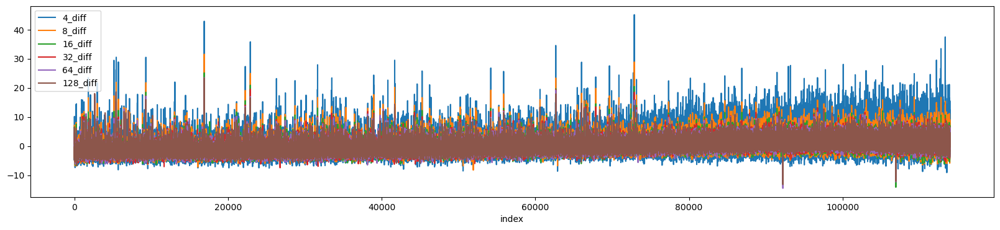

In [26]:
red_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff'])

<Axes: xlabel='index'>

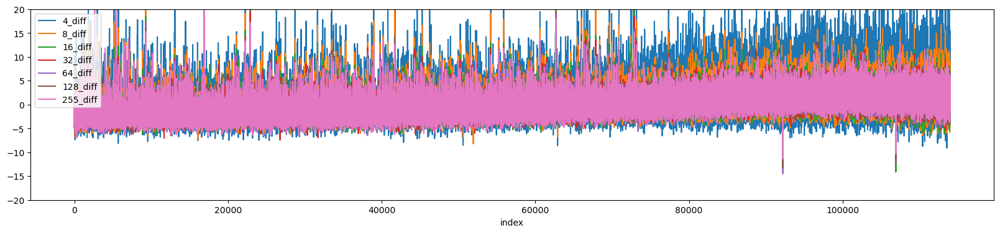

In [27]:
red_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

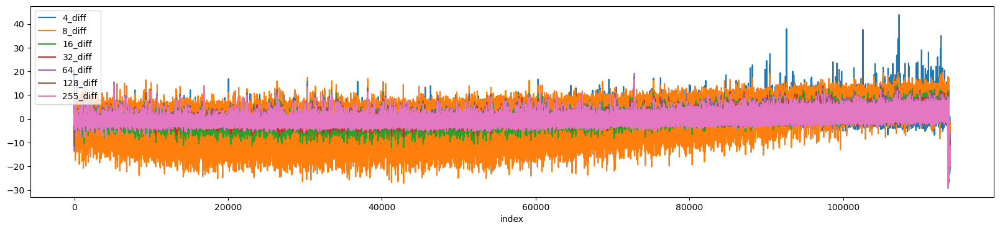

In [28]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

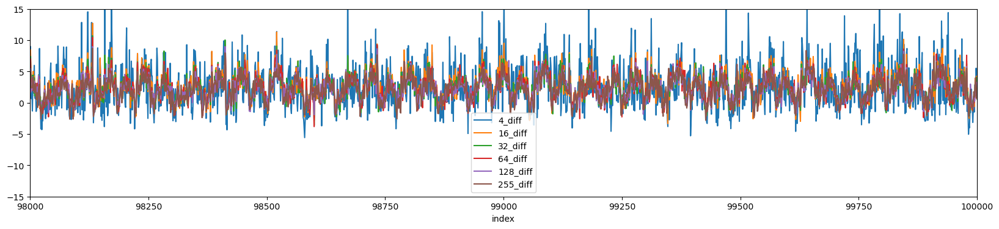

In [62]:
green_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [98000, 100000], x='index', y=['4_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

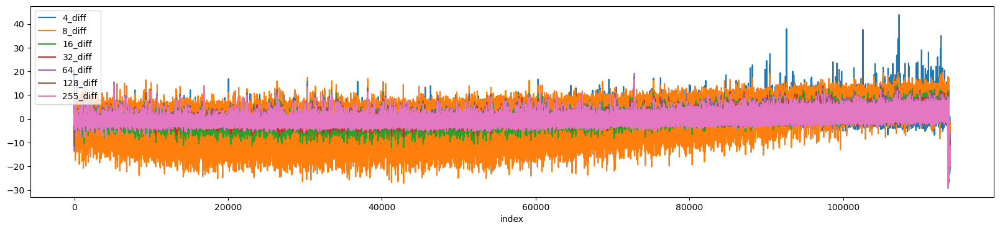

In [29]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

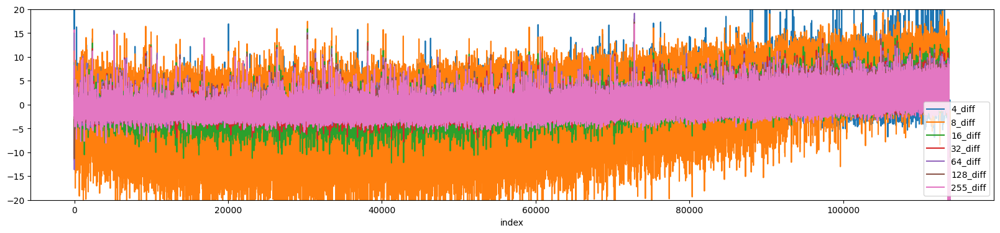

In [30]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

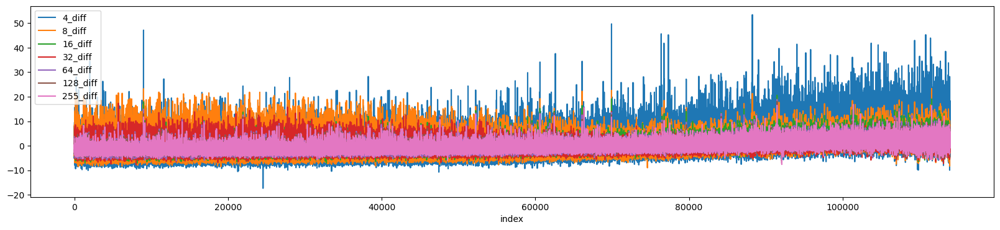

In [31]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

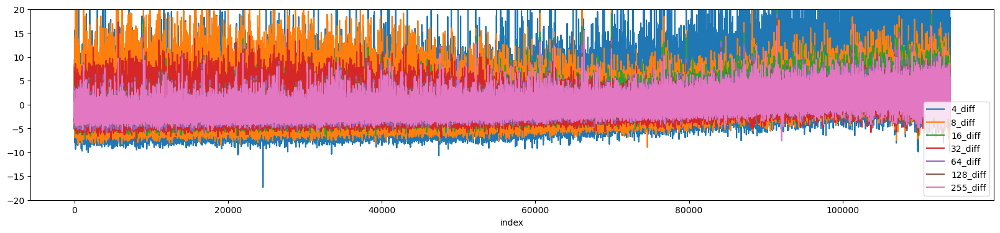

In [32]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

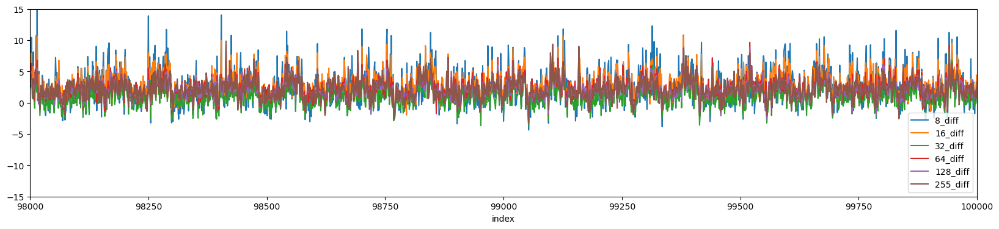

In [63]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [98000, 100000], x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [33]:
len(idxx)

50793

113979

In [40]:
max_id = min(len(red_new_df), len(green_new_df), len(blue_new_df))

idxx = list(filter(lambda x: x < max_id, idxx))

In [43]:
red_new_df.iloc[idxx].reset_index().reset_index()

,level_0,index,4_diff,8_diff,16_diff,32_diff,64_diff,128_diff,255_diff,A-1_4,...,A-1_64,A-1_128,A-1_255,B-1_4,B-1_8,B-1_16,B-1_32,B-1_64,B-1_128,B-1_255
0,0,17,12.983405,9.317891,8.365415,6.399863,8.010618,8.289286,8.748967,3.049210,...,-0.457731,0.023442,1.279036,-8.792614,-8.113439,-7.238966,-7.585745,-7.840293,-7.633113,-6.868968
1,1,190,-3.758176,-3.775799,-4.578232,-4.239555,-3.461752,-2.178883,-3.617632,16.374538,...,-4.520680,-4.270494,-4.493345,20.918882,10.437791,5.343761,1.414218,-1.096900,-2.138199,-0.908582
2,2,191,-1.328630,-1.567614,-1.810918,-0.793749,-1.407747,-0.980072,-0.829958,-0.800330,...,-8.583630,-9.574767,-7.641916,0.535414,-4.635084,-6.068480,-6.268677,-7.278344,-8.679763,-6.868968
3,3,192,-1.978814,-3.268573,-1.205799,-2.117145,-1.823439,-2.489393,-1.535355,27.330920,...,5.926905,0.528611,-2.919059,29.901428,20.582994,16.170758,12.609294,7.894291,3.095052,-1.405280
4,4,193,0.123225,0.160143,-0.458525,-0.340593,-1.751274,-1.745639,-0.305851,17.262894,...,1.863955,0.781195,1.016655,17.118575,8.118887,5.929004,4.267865,3.679670,2.571727,1.326563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50676,50676,113887,13.299953,10.929894,9.592791,11.525008,10.506114,10.704714,11.562185,25.258091,...,15.503858,14.420756,13.873320,10.554407,11.307379,8.269976,5.365421,4.522594,3.356715,2.071611
50677,50677,113888,12.152129,8.559544,9.952018,8.236317,9.113575,8.657560,8.983517,50.724275,...,19.566808,13.157834,11.511892,34.392701,26.090391,17.341244,12.828805,9.580139,4.141703,2.319961
50678,50678,113889,7.023609,6.803246,7.820656,7.455212,7.428961,8.123736,10.030509,36.806709,...,20.437440,15.431094,12.036653,27.828533,20.582994,18.219109,15.682452,12.108912,6.758328,1.823262
50679,50679,113891,7.990362,8.591793,5.829799,7.200135,8.164569,7.033930,7.471453,3.345328,...,9.409433,8.106145,8.363321,-4.301342,-2.606043,0.369194,-0.122361,1.150898,1.001752,0.829864


<Axes: xlabel='level_0'>

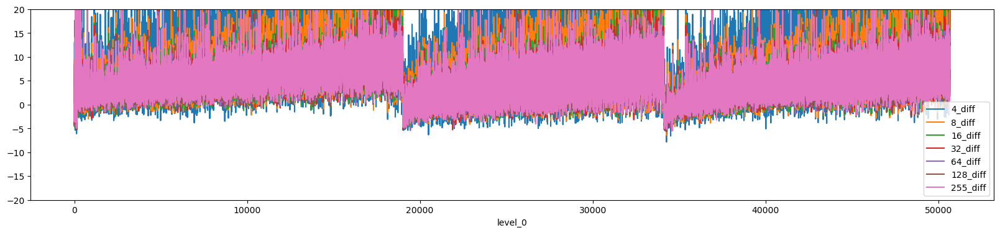

In [44]:
red_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

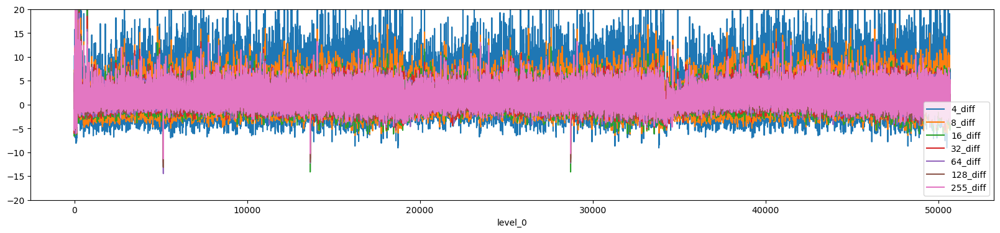

In [45]:
red_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [46]:
green_new_df

,4_diff,8_diff,16_diff,32_diff,64_diff,128_diff,255_diff,A-1_4,A-1_8,A-1_16,...,A-1_64,A-1_128,A-1_255,B-1_4,B-1_8,B-1_16,B-1_32,B-1_64,B-1_128,B-1_255
0,4.861072,1.913098,-2.021803,-6.907699,-11.024301,-10.822668,14.631257,-76.450558,-78.711108,-80.018650,...,-80.971634,-81.459933,-79.639708,-77.542245,-79.110740,-79.606330,-79.372080,-78.613975,-79.209889,-82.238446
1,19.933241,7.120337,1.490560,-5.592423,-5.392928,-7.560083,15.078598,-86.441230,-85.082236,-83.777518,...,-82.416827,-82.293195,-80.046914,-88.694736,-86.073827,-84.015772,-82.357700,-81.414526,-80.845066,-82.661341
2,12.245454,5.115065,-0.297214,-7.050187,-9.845026,-7.782532,9.128957,-77.021453,-79.798862,-80.216485,...,-80.489904,-81.043303,-79.232502,-79.528305,-80.781881,-80.157510,-78.286400,-78.359379,-79.443485,-80.969764
3,5.328367,0.425316,-6.804133,-8.869832,-12.560130,-10.822668,4.314444,-83.586752,-84.616056,-85.360199,...,-85.307211,-85.417925,-84.118972,-84.417068,-84.681209,-84.291362,-83.443380,-83.196694,-83.648227,-84.775811
4,1.752278,-7.013597,-6.591703,-12.149434,-13.896935,-11.791987,1.580929,-75.594214,-77.467961,-78.633804,...,-80.489904,-81.043303,-80.454120,-76.014507,-75.768458,-77.126019,-77.472140,-77.340997,-78.509098,-80.758317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113889,-7.894116,-1.374421,-7.400300,-6.940644,-6.935435,-8.199805,-13.093964,-60.037310,-57.422216,-56.871937,...,-56.403365,-56.253775,-56.632578,-56.612229,-56.828863,-53.425267,-53.044339,-53.154421,-52.346262,-50.098492
113890,-14.043521,-7.195034,-10.705212,-10.118434,-8.148474,-8.823176,-13.566227,-42.482271,-47.010860,-49.552037,...,-51.826923,-52.504099,-53.578534,-33.085058,-42.902689,-43.504023,-45.715999,-47.553319,-47.907923,-46.292445
113891,-14.649305,-7.364489,-10.696835,-8.246012,-5.841303,-9.285128,-12.666977,-39.627794,-45.301533,-48.562861,...,-49.418269,-50.837576,-52.356916,-29.265712,-40.953025,-42.401662,-44.901739,-46.280341,-45.805552,-45.446657
113892,-8.759369,-2.187720,-7.359959,-8.047605,-6.757453,-9.291727,-12.430371,-64.176303,-56.956036,-54.300081,...,-50.622596,-50.629261,-50.931696,-60.737123,-55.993292,-50.669366,-48.430199,-47.044128,-45.571956,-43.966527


<Axes: xlabel='level_0'>

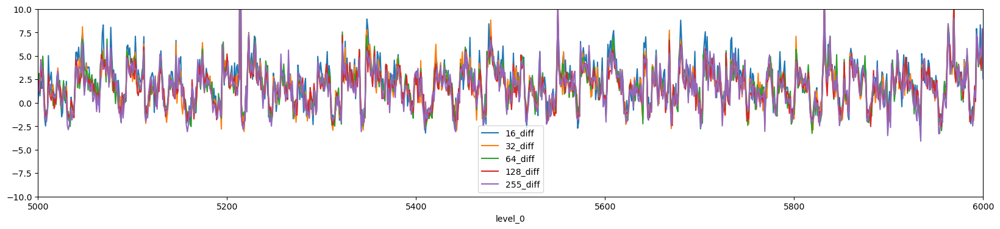

In [47]:
green_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],xlim=[5000,6000],ylim = [-10, 10],x='level_0', y=['16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

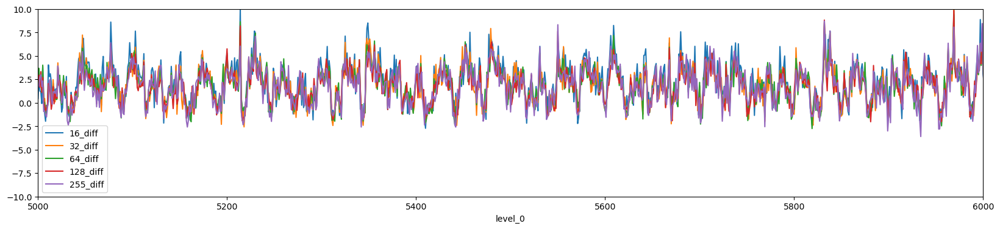

In [48]:
green_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],xlim=[5000,6000],ylim = [-10, 10],x='level_0', y=[ '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

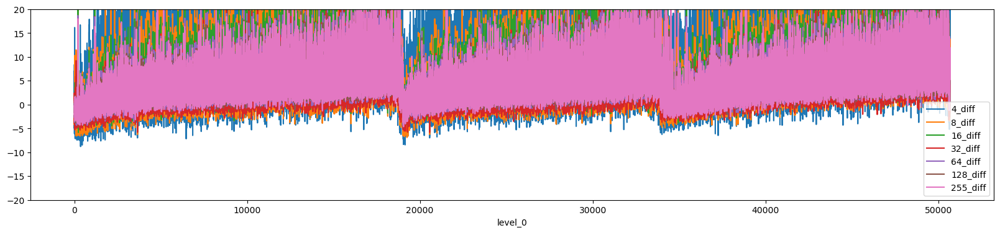

In [49]:
blue_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

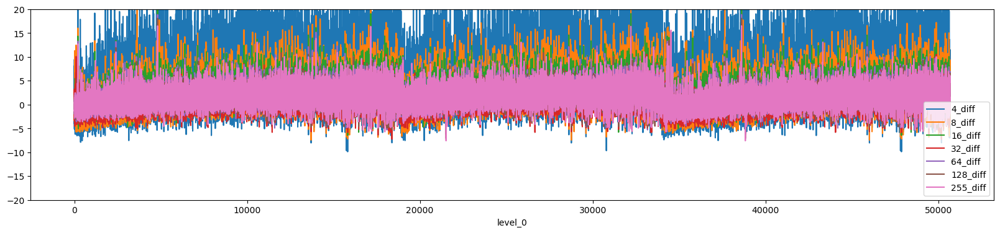

In [50]:
blue_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],x='level_0',ylim = [-20, 20], y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [51]:
print('all dots:', len(red_new_df))
print('overlap dots:', len(idxx))
 

all dots: 113976
overlap dots: 50681


In [52]:
print('red16 before')

print('mean', red_new_df.iloc[idxx]['16_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['16_diff'].abs().std())

print()

print('red16 after')

print('mean', red_ol_new_df.iloc[idxx]['16_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['16_diff'].abs().std())



red16 before
mean 5.188243667049963
standard deviation 3.7716100788019777

red16 after
mean 1.8207653142770508
standard deviation 1.5264874652557563


In [53]:
print('red32 before')

print('mean', red_new_df.iloc[idxx]['32_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['32_diff'].abs().std())

print()

print('red32 after')

print('mean', red_ol_new_df.iloc[idxx]['32_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['32_diff'].abs().std())



red32 before
mean 5.148815245304849
standard deviation 3.644092333737056

red32 after
mean 1.8770474585366375
standard deviation 1.4941219241567263


In [54]:
print('red128 before')

print('mean', red_new_df.iloc[idxx]['128_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['128_diff'].abs().std())

print()

print('red128 after')

print('mean', red_ol_new_df.iloc[idxx]['128_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['128_diff'].abs().std())



red128 before
mean 5.0136420736899066
standard deviation 3.4696517599236287

red128 after
mean 1.8508504574423068
standard deviation 1.4025341592332163


In [55]:
print('green16 before')

print('mean', green_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['16_diff'].std())

print()

print('green16 after')

print('mean', green_ol_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['16_diff'].std())
print()
print()

print('green32 before')

print('mean', green_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['32_diff'].std())

print()

print('green32 after')

print('mean', green_ol_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['32_diff'].std())
print()
print()

print('green128 before')

print('mean', green_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['128_diff'].std())

print()

print('green128 after')

print('mean', green_ol_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['128_diff'].std())



green16 before
mean 4.494410442405599
standard deviation 4.858588924170613

green16 after
mean 2.639945340383794
standard deviation 2.681647366581296


green32 before
mean 4.190374813529902
standard deviation 4.756275355255904

green32 after
mean 2.3639488391955217
standard deviation 2.416734067074507


green128 before
mean 3.9649723490740785
standard deviation 4.705442440083624

green128 after
mean 2.1573212392305274
standard deviation 2.3173864087216547


In [56]:
print('blue16 before')

print('mean', blue_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['16_diff'].std())

print()

print('blue16 after')

print('mean', blue_ol_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['16_diff'].std())
print()
print()

print('blue32 before')

print('mean', blue_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['32_diff'].std())

print()

print('blue32 after')

print('mean', blue_ol_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['32_diff'].std())
print()
print()

print('blue128 before')

print('mean', blue_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['128_diff'].std())

print()

print('blue128 after')

print('mean', blue_ol_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['128_diff'].std())



blue16 before
mean 6.155819863109425
standard deviation 5.152395953969491

blue16 after
mean 2.594584425838469
standard deviation 2.364143012892205


blue32 before


mean 4.193949186368645
standard deviation 4.594251796206621

blue32 after
mean 0.8996147467254432
standard deviation 1.982690307468609


blue128 before
mean 4.897446490130381
standard deviation 4.170583230658938

blue128 after
mean 1.76709696330489
standard deviation 1.832173967695944


/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1070: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='index', ylabel='[128_diff]'>

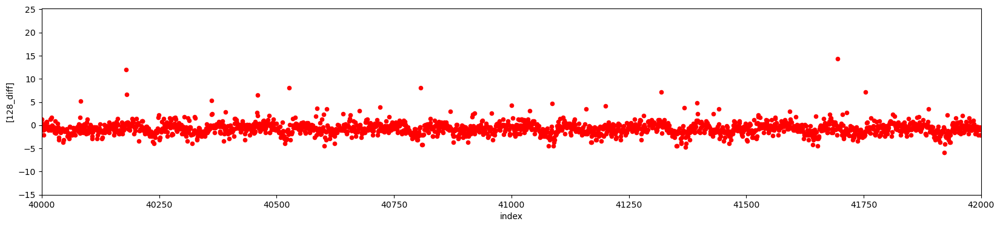

In [57]:
red_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='red')

<Axes: xlabel='index', ylabel='[128_diff]'>

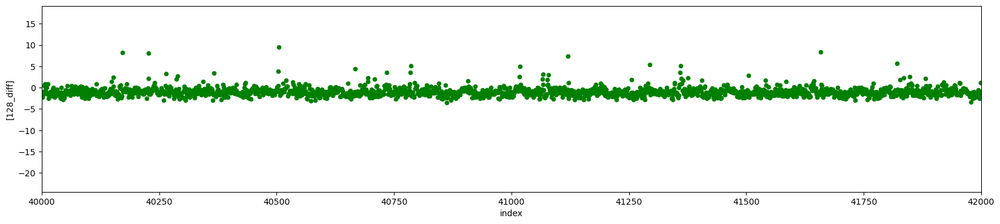

In [58]:
green_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='green')

<Axes: xlabel='index', ylabel='[128_diff]'>

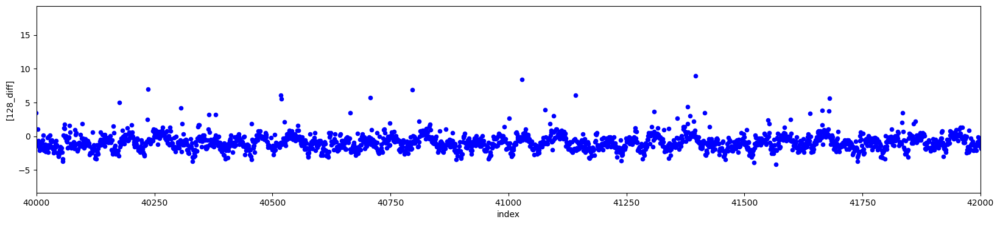

In [59]:
blue_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='blue')

In [60]:
print('mean', blue_ol_new_df['255_diff'].abs().std())


mean 1.2032907607206202


In [65]:
len(idxx) / len(blue_ol_new_df)

0.44464818389191085

In [66]:
print(red_ol_new_df['255_diff'].mean())
print(red_ol_new_df['128_diff'].mean())
print(red_ol_new_df['64_diff'].mean())
print(red_ol_new_df['32_diff'].mean())
print(red_ol_new_df['16_diff'].mean())
print(red_ol_new_df['8_diff'].mean())
print(red_ol_new_df['4_diff'].mean())



-0.001945422029336647
0.0005015360300189287
0.008687466260592068
0.018686588017827913
0.0611801024544283
0.14781291696301757
0.39159539765615975


In [67]:
print(green_ol_new_df['255_diff'].mean())
print(green_ol_new_df['128_diff'].mean())
print(green_ol_new_df['64_diff'].mean())
print(green_ol_new_df['32_diff'].mean())
print(green_ol_new_df['16_diff'].mean())
print(green_ol_new_df['8_diff'].mean())
print(green_ol_new_df['4_diff'].mean())



-0.026503692585448973
-0.02627951120146824
-0.014226911312975864
0.0031907217994549134
0.06382046839266205
0.8021850366934113
0.30958803862526946


In [68]:
print(blue_ol_new_df['255_diff'].mean())
print(blue_ol_new_df['128_diff'].mean())
print(blue_ol_new_df['64_diff'].mean())
print(blue_ol_new_df['32_diff'].mean())
print(blue_ol_new_df['16_diff'].mean())
print(blue_ol_new_df['8_diff'].mean())
print(blue_ol_new_df['4_diff'].mean())



-0.0035626807053592033
-0.008892661680251593
-0.002842453174150797
-0.052490841451455494
0.04988311857817929
-0.04904729671913919
0.4467374988110307


In [69]:
print((len(red_ol_new_df[red_ol_new_df['255_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['255_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['128_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['128_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['64_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['64_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['32_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['32_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['16_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['16_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['8_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['8_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['4_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['4_diff'] > 10])) / len(red_ol_new_df))

0.00047378395451674036
0.0003334035235488173
0.00041236751596827404
0.0005615217238716922
0.000728223485646101
0.0022109917877447885
0.015977047799536744


In [70]:
print((len(green_ol_new_df[green_ol_new_df['255_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['255_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['128_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['128_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['64_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['64_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['32_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['32_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['16_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['16_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['8_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['8_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['4_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['4_diff'] > 10])) / len(green_ol_new_df))

0.001905280348394121
0.0018789400670799164
0.0016067571601664705
0.001852599785765712
0.0025550072874778304
0.11271884383725218
0.009605422585913218


In [71]:
print((len(blue_ol_new_df[blue_ol_new_df['255_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['255_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['128_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['128_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['64_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['64_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['32_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['32_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['16_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['16_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['8_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['8_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['4_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['4_diff'] > 10])) / len(blue_ol_new_df))

0.00021933672574135814
0.00022811019477101245
0.0003070714160379014
0.0008422530268468152
0.0011668713809440253
0.01287945253553255
0.050535181610808916


In [72]:
print(red_ol_new_df[(-10 < red_ol_new_df['255_diff']) & (red_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['128_diff']) & (red_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['64_diff']) & (red_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['32_diff']) & (red_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['16_diff']) & (red_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['8_diff']) & (red_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['4_diff']) & (red_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.007501604092782203
-0.0033684160407341035
0.003966112920011323
0.012233961707108344
0.05273880121996944
0.12053259519210992
0.18349976404739196


In [73]:
print(green_ol_new_df[(-10 < green_ol_new_df['255_diff']) & (green_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['128_diff']) & (green_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['64_diff']) & (green_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['32_diff']) & (green_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['16_diff']) & (green_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['8_diff']) & (green_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['4_diff']) & (green_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

0.0018075272602638198
-0.005805110541102804
-0.0036803925168392795
0.01824699796638781
0.08073611510110033
1.5758205043078308
0.24000366026525172


In [74]:
print(blue_ol_new_df[(-10 < blue_ol_new_df['255_diff']) & (blue_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['128_diff']) & (blue_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['64_diff']) & (blue_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['32_diff']) & (blue_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['16_diff']) & (blue_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['8_diff']) & (blue_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['4_diff']) & (blue_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.006247925448947584
-0.011676286199767301
-0.006583622799461029
-0.06225339459976821
0.03631995137991437
-0.21586859411938178
-0.2855286466635445
